# Project 2: Advanced Lane Finding ##

## Import necessary packages ## 

In [11]:
import numpy as np
from numpy.linalg import inv
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg 
from glob import glob

## Camera calibration ##
The first step is to callibrate the camera, and correct for distortion.

To start, we need to find the chessboard corners on the images. These corners will be displayed on a separate window. <br>

To display on a separate window, set <code>show_images = True</code>. In addition, set <code>interactive = True</code> to better analyze each image, and press 'q' to quit, and any other key to advance.

In [23]:

show_images = False  # Set to True to display the chessboards on a separate window
interactive = False  # Set to True to better anaylze each image. Press 'q' to quit, and any other key to advance

# importing the images
images = [cv2.imread(image) for image in glob("camera_cal/calibration*.jpg")]

# Get the size of all images, for calibration
height, width = images[0].shape[:2]

pattern = (9, 6)  # the pattern of the chessboard

# The coordinates of the corners in the real world, measured in squares (length of a square side)
# (x, y, z) for each corner, with z=0 for all of them, for simplicity.
real_corners = np.zeros((pattern[0]*pattern[1], 3), np.float32)
real_corners[:, :2] = np.mgrid[0:pattern[0], 0:pattern[1]].T.reshape(-1, 2)

# Stores the real corner coordinates for each chessboard. 
# All will have the same set of coordinates [(0, 0, 0), (1, 0, 0), (x, y, z)], 
# where (x, y, z) are measured in squares 
object_points = []

# This will contain the coordinates of the corners of each chessboard image.
# Since all images are different, the coordinates will be different.
# The coordinates are measured in pixels.
image_points = []

for i, img in enumerate(images):
    # image = cv2.imread(img)
    image = np.copy(img)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, pattern)

    if ret:
        image_points.append(corners)
        object_points.append(real_corners)

        if show_images:
            cv2.drawChessboardCorners(image, pattern, corners, ret)
            cv2.imshow("Chessboard corners", image)
            key = None

            if interactive:
                # if the program is interactive, wait forever until a key is pressed
                key = cv2.waitKey(0)
                # Next image will be shown when the user presses the spacebar
                if key == ord(' '):
                    continue
            else:  # otherwise, just move to next image after 0.5s
                key = cv2.waitKey(500)

            # if the user quits, no more images will be show, but corners will still be appended.
            if key == ord('q'):
                show_images = False

cv2.destroyAllWindows()

**These corners can be used to find the camera matrix and the distortion coefficients.**

In [13]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(object_points, image_points, (width, height), None, None)

**The matrix `mtx` and the distortion coefficients `dist` can be used to undistort the images. A test is done below.**

In [14]:
# for i, image in enumerate(images):
#     undistorted = cv2.undistort(image, mtx, dist)
#     f, (left, right) = plt.subplots(1, 2, figsize=(16, 9))
#     left.set_title("Original image "+str(i+1))
#     left.imshow(image)
#     right.set_title("Undistorted image "+str(i+1))
#     right.imshow(undistorted)
    

**It looks like the undistortion and camera calibration were successful. This means that the camera matrix `mtx` and the distortion coefficients `dist` obtained earlier are suitable to undistort the images from the road.**

## Color thresholding
This will keep only the desired colors of the lanes (yellow and white) in the image

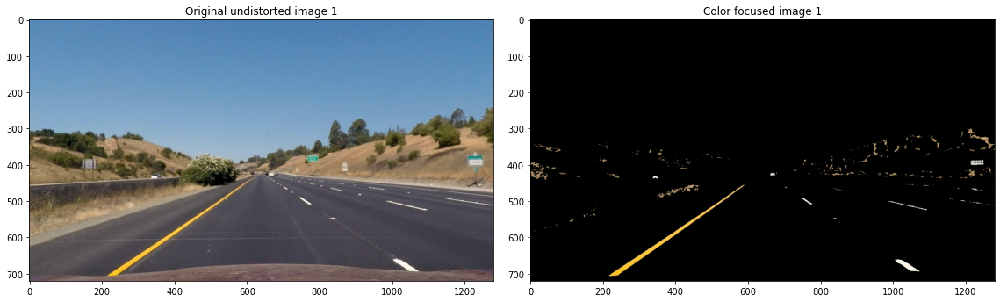

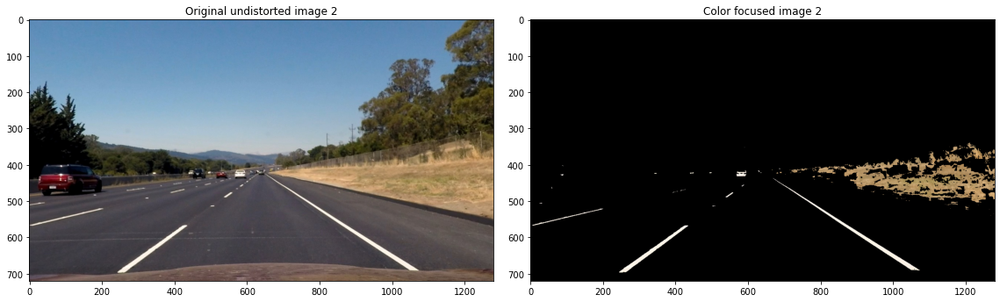

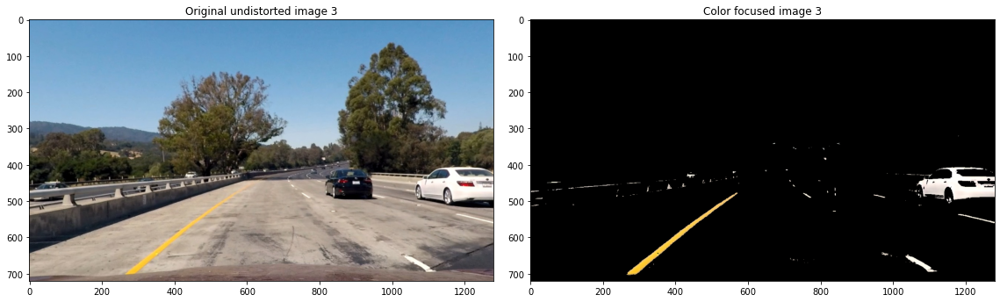

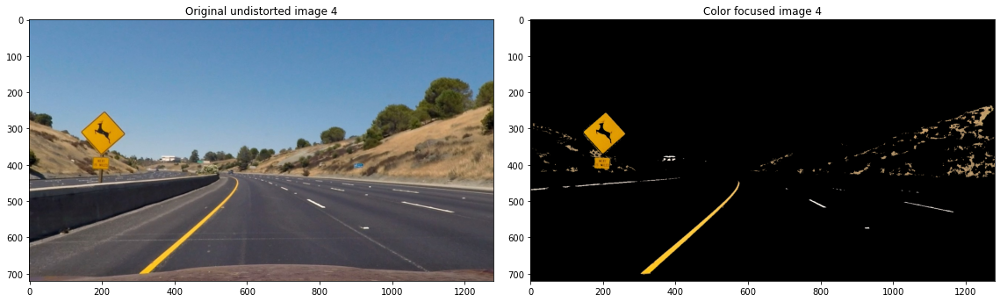

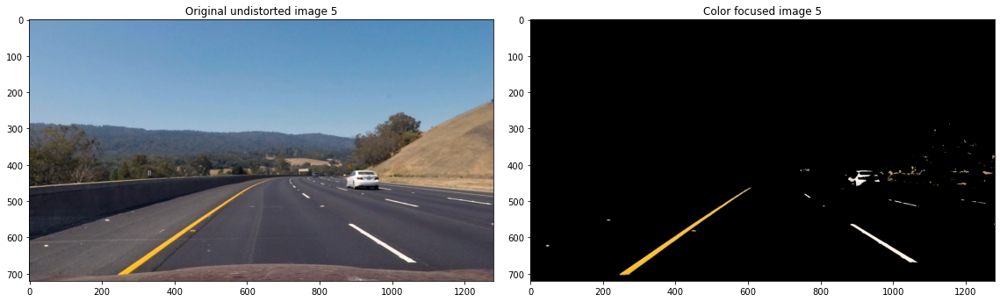

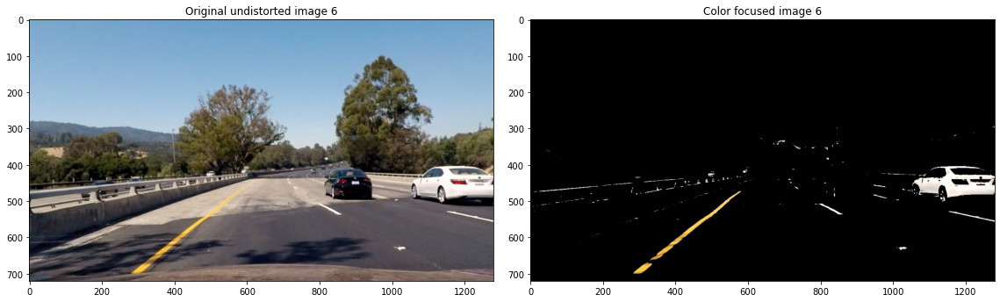

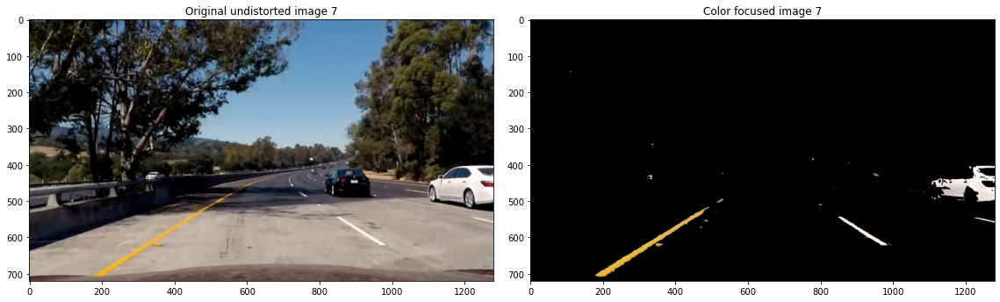

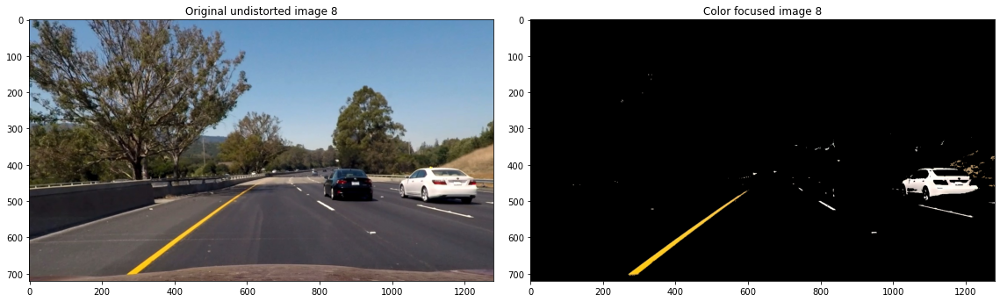

In [15]:
# First, a function to focus on a particular color (yellow to white, in this case)
def color_focus(image):
    """
    Keep mostly just yellow and white in the given image
    """
    # the range of shades of yellow to detect, in HSV
    yellow_min_hsv = (17, 95, 160)
    yellow_max_hsv = (25, 255, 255)
    # the range of shades of white to detect, in HSV
    white_min_hsv = (0, 0, 200)
    white_max_hsv = (80, 30, 255)
    
    # convert the image from rgb to hsv, for easy manipulation
    hsv_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
    # a mask to filter only the tones of yellow that are between those specified
    yellow_mask = cv2.inRange(hsv_image, yellow_min_hsv, yellow_max_hsv)
    # a mask to filter only the tones of white that are between those specified
    white_mask = cv2.inRange(hsv_image, white_min_hsv, white_max_hsv)
    # combining the masks so only whites and yellows are kept in the image
    color_mask = yellow_mask | white_mask
    
    return color_mask

# selecting all images in the test_images folder
test_images = [mpimg.imread(image) for image in glob("test_images/*")]

# undistort the test images
undistorted_images = [cv2.undistort(image, mtx, dist) for image in test_images]
for i, undistorted in enumerate(undistorted_images):
    mpimg.imsave(f"output_images/Undistorted_images/Undistorted{i+1}.jpg", undistorted)

# applying color_focus() to each of the undistorted images, to get the masks
color_focused = list(map(color_focus, undistorted_images))

# plotting the original vs the color focused image
for i, image in enumerate(undistorted_images):
    f, (left, right) = plt.subplots(1, 2, figsize=(16, 9))
    f.tight_layout()
    left.set_title("Original undistorted image " + str(i+1))
    left.imshow(image)

    right.set_title("Color focused image "+ str(i+1))
    # plotting the part of the original image where only yellow and white are shown
    right.imshow(cv2.bitwise_and(image, image, mask=color_focused[i]))



## Magnitude and Gradient thresholding
Color thresholding alone seems to identify the lanes pretty well. Let's try to combine it with magnitude and gradient thresholding.

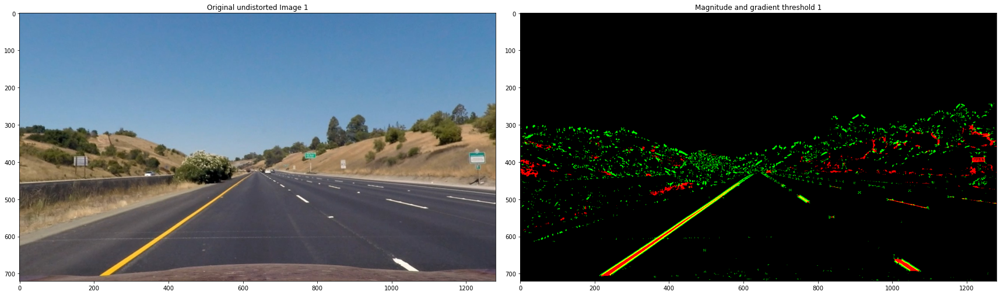

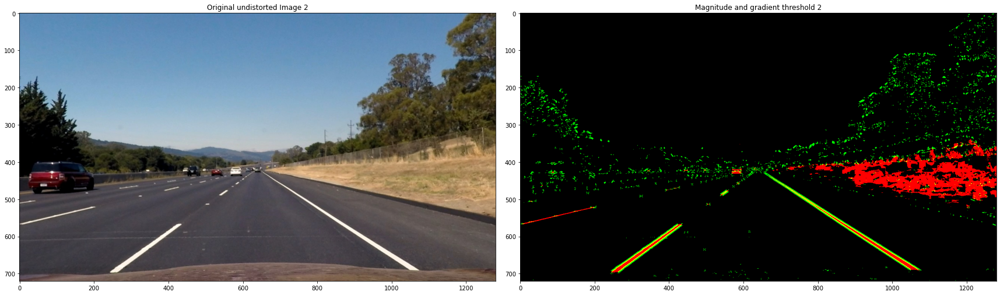

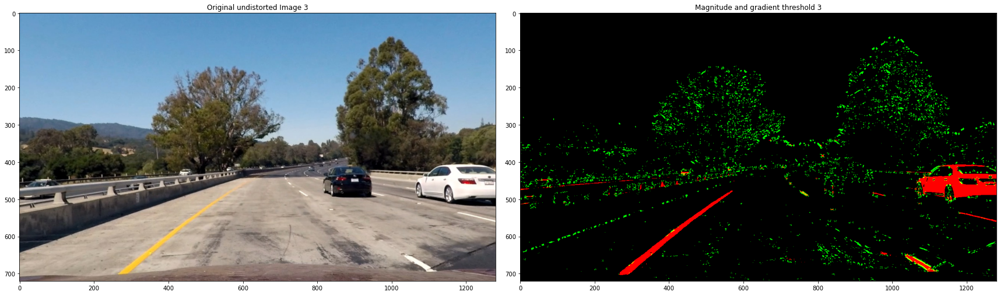

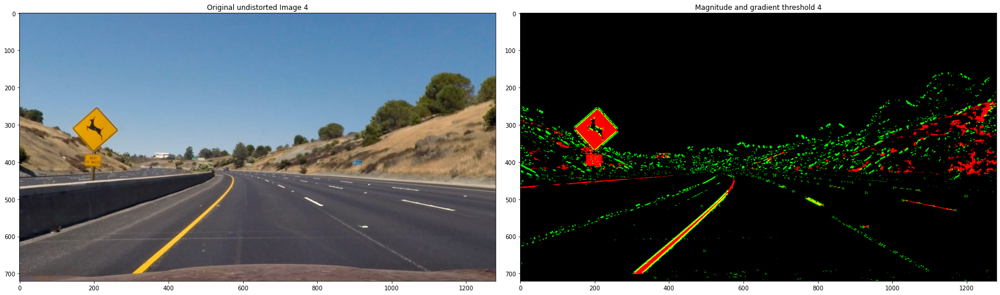

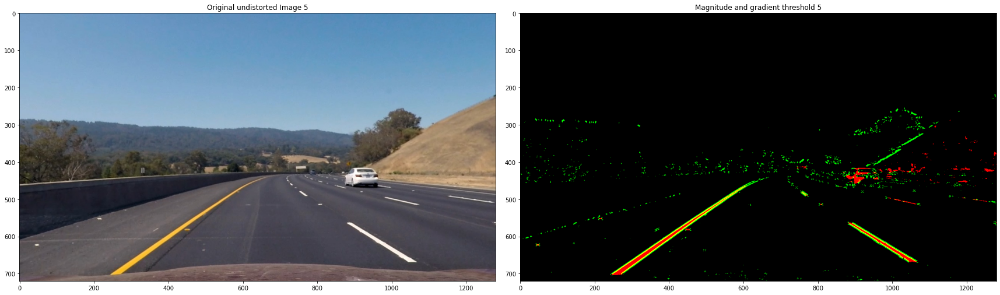

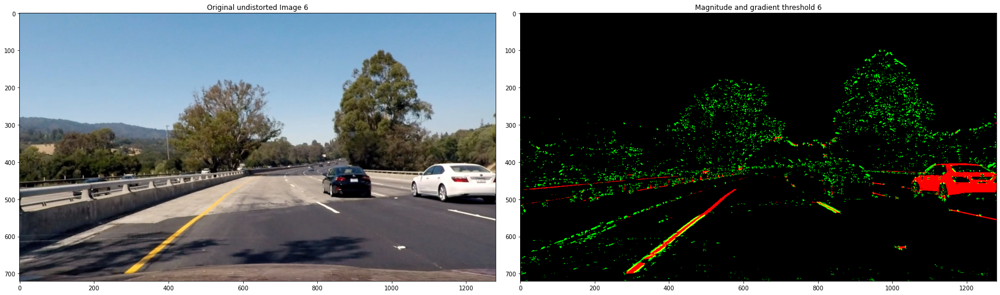

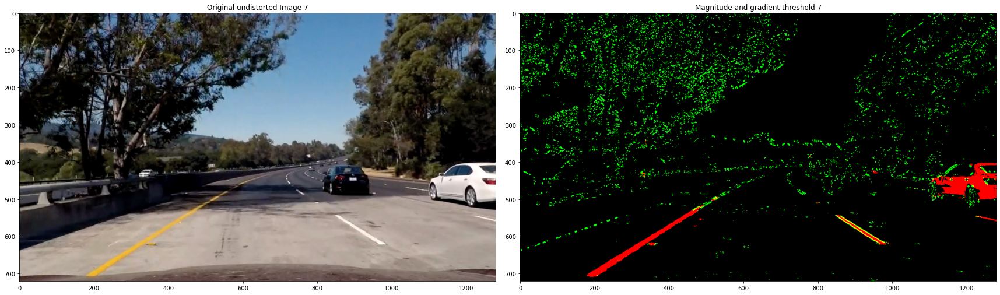

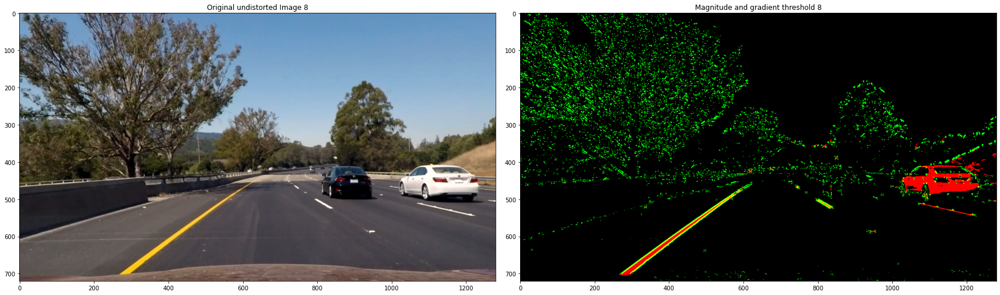

In [16]:
# Define a function that applies Sobel x and y, 
# then computes the magnitude of the gradient
# and applies a threshold
def mag_thresh(img, sobel_kernel=5, mag_thresh=(30, 255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x and y
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    sobel = np.sqrt(sobel_x**2 + sobel_y**2)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    sobel = np.uint8(sobel * 255 / np.max(sobel))
    # 5) Create a mask where the scaled gradient magnitude 
    # is > thresh_min and < thresh_max
    mask = (sobel >= mag_thresh[0]) & (sobel <= mag_thresh[1])

    return mask
    
# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_thresh(img, sobel_kernel=5, thresh=(0, np.pi/2)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x and y
    sobel_x = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobel_y = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobel_x = np.abs(sobel_x)
    abs_sobel_y = np.abs(sobel_y)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    # This is the direction in which the color intensity changes the most around each pixel
    directions = np.arctan2(abs_sobel_x, abs_sobel_y)
    # 5) Create a mask where direction thresholds are met
    mask = (min(thresh) <= directions) & (directions <= max(thresh))
    # 6) Return this mask as your image
    return mask

# a mask for pixels whose gradient magnitude and direction are suitable
mag_dir_masks = [] 
# a combination of color thresholding and maginitude & gradient thresholding
color_mag_dir_masks = [] 

for i, image in enumerate(undistorted_images):
    # applying gradient magnitude thresholding to each image
    mag_binary = mag_thresh(image)
    # applying gradient direction thresholding to each image
    dir_binary = dir_thresh(image, sobel_kernel=15, thresh=(np.radians(20), np.radians(50)))
    
    # combining both masks and scaling the result
    mag_dir_mask = np.uint8(mag_binary & dir_binary)*255
    mag_dir_masks.append(mag_dir_mask)
 
    color_mag_dir_masks.append(color_focused[i] | mag_dir_mask)
    # making a color plot, with the color focused part red, the mag & dir part green, and a third blue layer for completion
    color_mag_dir = np.dstack((color_focused[i], mag_dir_mask, np.zeros_like(mag_dir_mask)))

    f, (original, masked) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    original.imshow(image)
    original.set_title('Original undistorted Image ' + str(i+1))
    masked.imshow(color_mag_dir, cmap='gray')
    masked.set_title('Magnitude and gradient threshold ' + str(i+1))

In the images above, red are the parts detected by the color thresholding, green are the parts detected by gradient and maginitude thresholding, and yellow is where both detect the same feature. It can be seen that when it comes to detecting lanes, color detection is more significant, as the lane lines shown are either red or yellow. The gradient and maginitude simply add more irrelevant features.
With this, the conclusion is that gradient and maginitude thresholding does not significantly contribute to better line detection, provided that good color thresholding is in place.

## Perspective transform

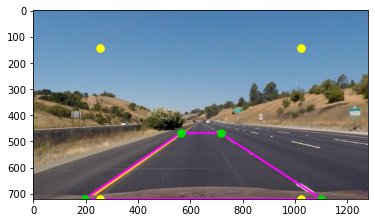

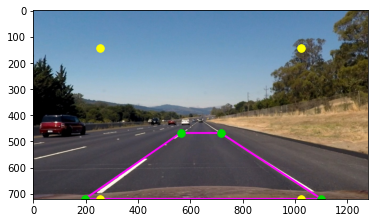

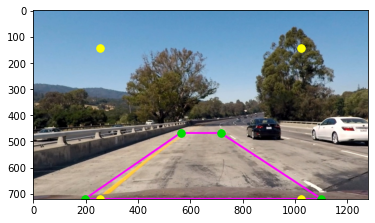

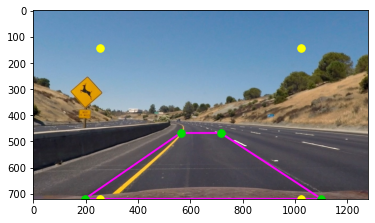

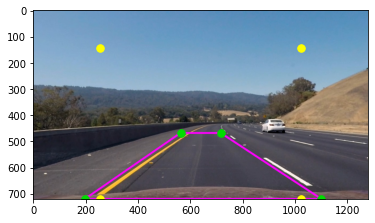

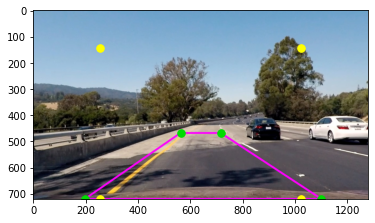

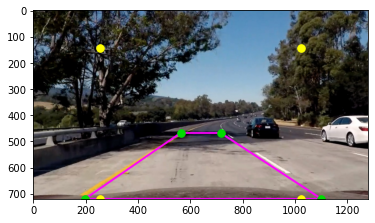

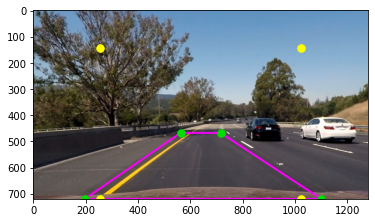

In [17]:
# defining the points in the image that will be mapped onto a rectangle
src = np.float32(np.round([
    [0.155 * width, height-1], 
    [0.44 * width, 0.65 * height], 
    [0.56 * width, 0.65 * height], 
    [0.86 * width, height-1]
]))

# defining the points where the src points must land
dst = np.float32(np.round([
    [0.2 * width, height - 1],
    [0.2 * width, 0.2 * height],
    [0.8 * width, 0.2 * height],
    [0.8 * width, height - 1]
]))

for image in undistorted_images:
    # creating a copy of the image in order to edit it
    img = np.copy(image)
    highlighted_image = cv2.polylines(img, np.int32([src]), isClosed=True, color=(255, 0, 255), thickness=5)
    plt.figure()
    # showing the polygon
    plt.imshow(highlighted_image)
    # plotting the points
    plt.plot(src[:, 0], src[:, 1], '.', color='#00DD00', markersize=15)
    plt.plot(dst[:, 0], dst[:, 1], '.', color='#ffff00', markersize=15)

Now that we have the source points, `src` and the destination points `dst`, we can get the perspective transform matrix.

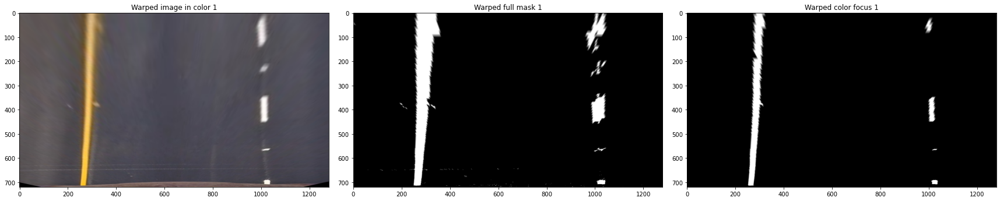

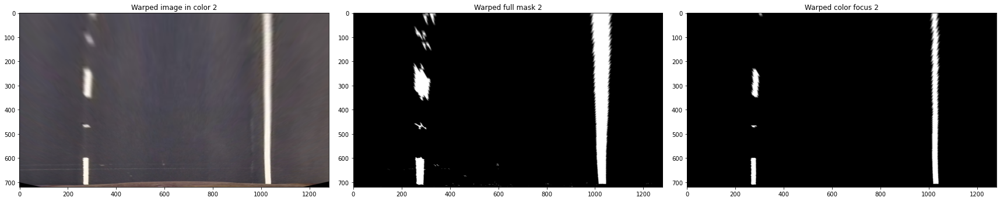

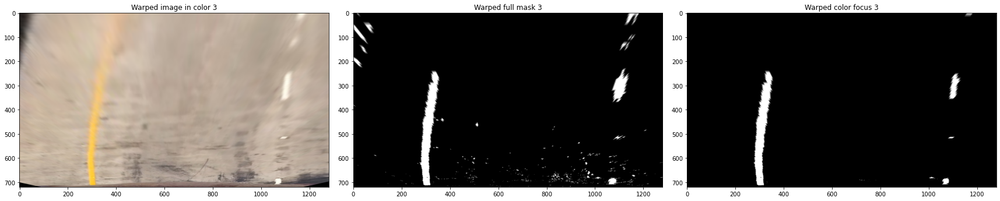

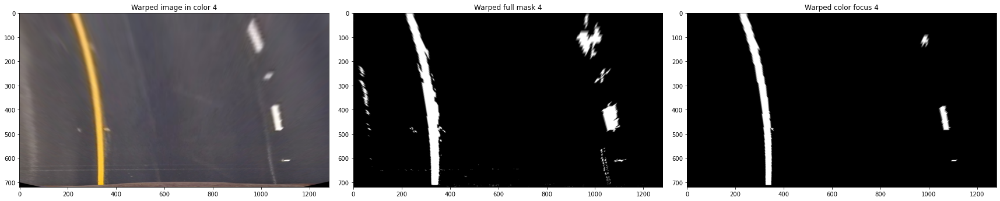

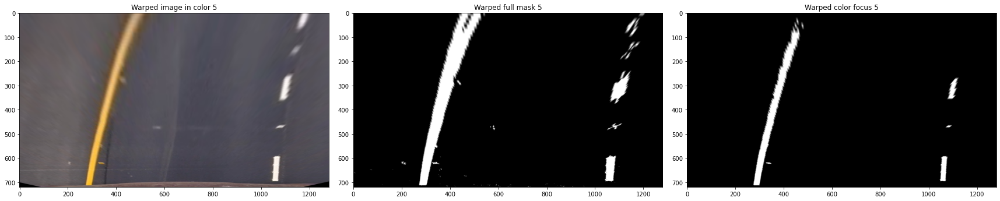

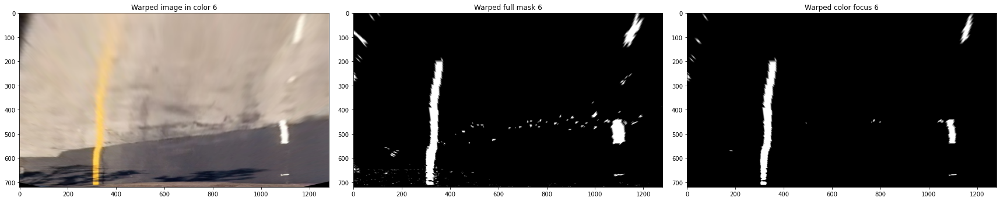

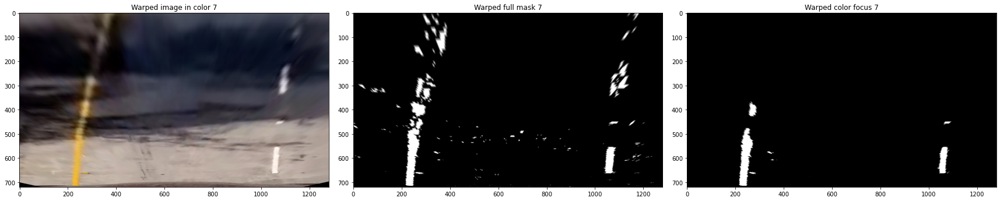

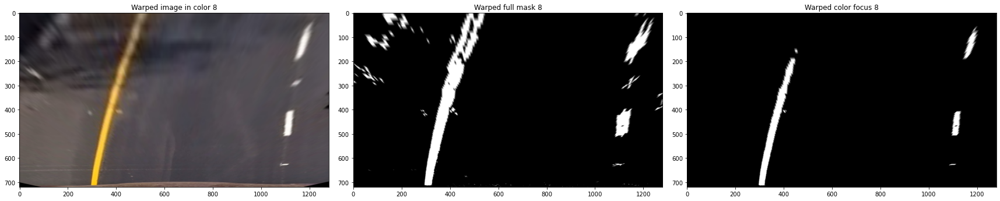

In [18]:
# getting the perspective transform matrices
persp_mtx = cv2.getPerspectiveTransform(src, dst)
inv_mtx = cv2.getPerspectiveTransform(dst, src)

# an array containing top views of the road, for later use
top_views = []

for i, image in enumerate(undistorted_images):
    warped_original = cv2.warpPerspective(image, persp_mtx, (width, height), flags=cv2.INTER_LINEAR)
    warped_full_mask = cv2.warpPerspective(color_mag_dir_masks[i], persp_mtx, (width, height), flags=cv2.INTER_LINEAR)
    warped_color_focus = cv2.warpPerspective(color_focused[i], persp_mtx, (width, height), flags=cv2.INTER_LINEAR)

    # adding the warped full masks to the top views list
    top_views.append(warped_full_mask)

    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(24, 9))
    f.tight_layout()

    ax1.imshow(warped_original)
    ax1.set_title('Warped image in color '+ str(i+1))

    ax2.imshow(warped_full_mask, cmap='gray')
    ax2.set_title('Warped full mask ' + str(i+1))

    ax3.imshow(warped_color_focus, cmap='gray')
    ax3.set_title('Warped color focus ' + str(i+1))


This shows that gradient and magnitude thresholding does add more detail to the lane lines, indeed, as the lines with the full mask have more detail that color thresholding alone was not able to achieve.

## Finding the lines

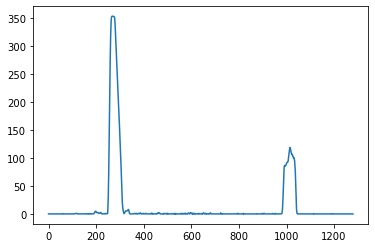

In [19]:
# using a histogram to find which pixels belong to the left and right lane lines
# the bottom half is where lines are the closest to vertical, and the columns with the highest sum is where the lane lines are
hist = np.sum(top_views[0][height//2:]/255, axis=0)

plt.plot(np.arange(0, width), hist)


This histogram can be used to identify where the lane lines are. It is almost obvious that the left line is a solid line and the right one is dashed.

In [20]:
def find_lane_pixels(binary_warped, left_fit=None, right_fit=None, show_rectangles=False):
    height, width = binary_warped.shape

    # Create a 3 channel color output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy, nonzerox = nonzero

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # if previous fits are not given, use sliding windows method
    if left_fit == None or right_fit == None:
        # Take a histogram of the bottom half of the image
        histogram = np.sum(binary_warped[height//2:, :], axis=0)
        
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = width//2
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # HYPERPARAMETERS
        # The number of sliding windows
        nwindows = 9
        # The width of the windows +/- margin
        margin = 100
        # The minimum number of pixels found in a window to recenter window
        minpix = 50

        # Set height of windows - based on nwindows above and image shape
        window_height = height//nwindows

        # Current positions to be updated later for each window in nwindows
        leftx_current = leftx_base
        rightx_current = rightx_base


        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = height - (window+1) * window_height  # top edge of the rectangle
            win_y_high = height - window * window_height  # bottom edge of he rectangle
            win_xleft_low = leftx_current - margin  # left edge of left side window
            win_xleft_high = leftx_current + margin  # right edge of left side window
            win_xright_low = rightx_current - margin  # left edge of right side window
            win_xright_high = rightx_current + margin  # right edge of right side window
            
            if show_rectangles:
                # Draw the windows on the visualization image
                cv2.rectangle(out_img, (win_xleft_low, win_y_low), (win_xleft_high, win_y_high), (0, 255, 0), 2) 
                cv2.rectangle(out_img, (win_xright_low, win_y_low), (win_xright_high, win_y_high), (0, 255, 0), 2) 
            
            # Identify the nonzero pixels in x and y within the window #
            # The positions within the nonzeroy and nonzerox array that satisfy the conditions below.
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]

            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
            
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices (previously was a list of lists of pixels)
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    
    # if the previous fit is given, search activated pixels within a margin of the fit
    else:
        # HYPERPARAMETER
        # Choose the width of the margin around the previous polynomial to search
        margin = 100

        ### Set the area of search based on activated x-values ###
        ### within the +/- margin of our polynomial function ###
        # For each nonzeroy, this will test whether the corresponding nonzerox is less or 
        # greater than what it is supposed to be according to the polynomials
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
                        left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
                        left_fit[1]*nonzeroy + left_fit[2] + margin)))
                        
        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
                        right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
                        right_fit[1]*nonzeroy + right_fit[2] + margin)))

    # Extract left and right line pixel positions
    # This will return an array containing the elements with good indices within the nonzero arrays
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    # Color in left and right line pixels
    out_img[lefty, leftx] = [255, 0, 0]  # left will be red
    out_img[righty, rightx] = [0, 0, 255]  # right will be blue

    return leftx, lefty, rightx, righty, out_img


def calc_curve_rad(left_fit, right_fit, ploty, height, width):
    """
    Finds the radius of curvature (in meters) for each lane line, and the point closest to the car.
    """
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/height  # meters per pixel in y dimension (not very accurate)
    # The lane width at y = 0 in px is C_right - C_left
    lane_width_px = right_fit[2] - left_fit[2]
    xm_per_pix = 3.7/lane_width_px # meters per pixel in x dimension (more accurate)

    A_left = left_fit[0] * xm_per_pix / ym_per_pix**2
    A_right = right_fit[0] * xm_per_pix / ym_per_pix**2

    B_left = left_fit[1] * xm_per_pix / ym_per_pix
    B_right = right_fit[1] * xm_per_pix / ym_per_pix

    C_left = left_fit[2] * xm_per_pix
    C_right = right_fit[2] * xm_per_pix

    # Define y-value where we want radius of curvature
    # We'll choose the maximum y-value, corresponding to the bottom of the image
    # it can be confusing, but keep in mind that this is measuring y from the top (i.e, the furthest from the car)
    y_eval = np.max(ploty) * ym_per_pix

    offset = ((right_fit[2] + left_fit[2]) - width)/2 

    # The calculation radius of curvature for each line
    left_curverad = ( 1 + (2*A_left*y_eval + B_left)**2)**1.5 / np.abs(2*A_left)
    right_curverad = ( 1 + (2*A_right*y_eval + B_right)**2)**1.5 / np.abs(2*A_right)  
    
    return left_curverad, right_curverad


def fit_polynomial(binary_warped, leftx=None, lefty=None, rightx=None, righty=None):
    """
    This function finds a 2nd order polynomial that can fit each lane line. 
    It paints the lane in green as well.
    """
    height, width = binary_warped.shape

    # if any([var is None for var in (leftx, lefty, rightx, righty)])

    # if leftx, lefty, rightx and righty are not given, find them
    if leftx == None or lefty == None or rightx == None or righty == None:
        # Find our lane pixels first
        leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)

    # Fit a second order polynomial to each using `np.polyfit`
    A_left, B_left, C_left = left_fit = np.polyfit(lefty, leftx, 2)
    A_right, B_right, C_right = right_fit = np.polyfit(righty, rightx, 2)
    # print(left_fit, right_fit)

    offset = (right_fit[2] + left_fit[2])/2 - width/2

    # Generate x and y values for plotting
    ploty = np.arange(height)
    left_fitx = A_left * ploty**2 + B_left * ploty + C_left
    right_fitx = A_right * ploty**2 + B_right * ploty + C_right

    left_curve_rad, right_curve_rad = calc_curve_rad(left_fit, right_fit, ploty)
    avg_rad = (left_curve_rad + right_curve_rad)/2

    # The boundary of the lane
    left_pts = np.vstack([left_fitx, ploty]).T
    right_pts = np.flipud(np.vstack([right_fitx, ploty]).T)
    lane_boundary = [np.concatenate([left_pts, right_pts])]

    lane_overlay = np.zeros((height, width, 3), dtype=np.uint8)
    # Draw the lane onto the warped blank image
    cv2.fillPoly(lane_overlay, np.int_(lane_boundary), (0, 255, 0))
    # combining the overlay with the binary warped image
    out_img = cv2.addWeighted(out_img, 1, lane_overlay, 0.8, 0)
    # writing the radius of curvature and direction on the lane
    dominant_curve = [A_left, A_right][np.argmax(np.abs([A_left, A_right]))]
    radius_txt = str(round(avg_rad))+" m"
    text = radius_txt + " ->" if dominant_curve >=0 else "<- " + radius_txt 
    cv2.putText(out_img, text, (450, 650), cv2.FONT_HERSHEY_SIMPLEX, 2, (0,0,0), 3, cv2.LINE_4)

    return left_fitx, right_fitx, ploty, out_img


warped_lanes = []
for top_view in top_views:
    left_fitx, right_fitx, ploty, out_img = fit_polynomial(top_view)
    warped_lanes.append(out_img)
    # Plot the left and right polynomials on the lane lines
    plt.figure()
    plt.imshow(out_img)
    # plt.plot(left_fitx, ploty, color='yellow')
    # plt.plot(right_fitx, ploty, color='yellow')

    


c:\Users\danim\Anaconda3\envs\carnd-term1\lib\site-packages\ipykernel_launcher.py:71: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note link for additional information.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
c:\Users\danim\Anaconda3\envs\carnd-term1\lib\site-packages\ipykernel_launcher.py:73: DeprecationWarning: `np.int` is a deprecated alias for the builtin `int`. To silence this warning, use `int` by itself. Doing this will not modify any behavior and is safe. When replacing `np.int`, you may wish to use e.g. `np.int64` or `np.int32` to specify the precision. If you wish to review your current use, check the release note

TypeError: calc_curve_rad() missing 2 required positional arguments: 'height' and 'width'

The polynomial fitting and lane line detection appears to work well, except for one image. This will probably be solved when finidng the lane lines based on polynomial fits from previous frames.

Let us see what this will look like when unwarped.

## Unwarping

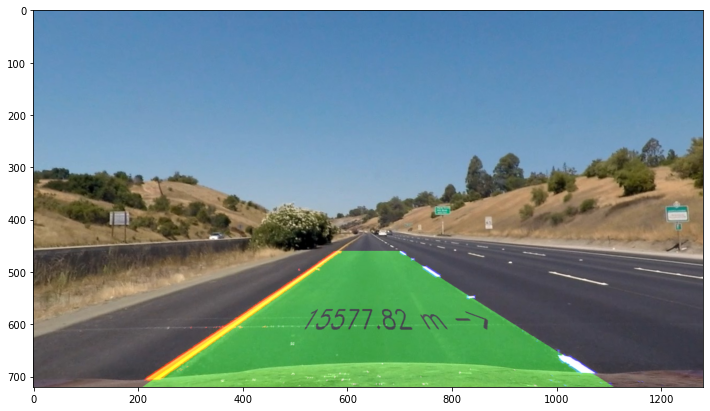

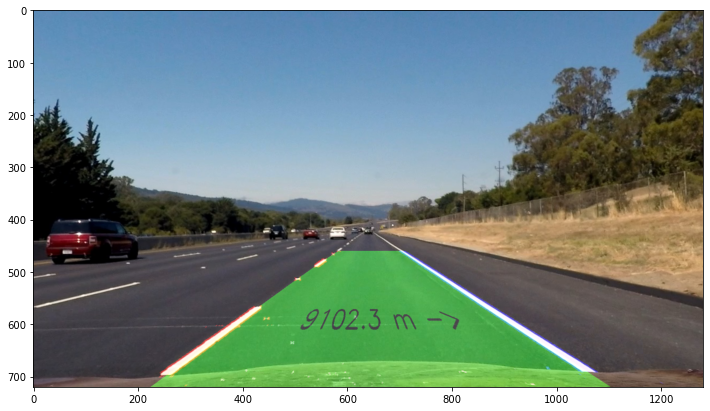

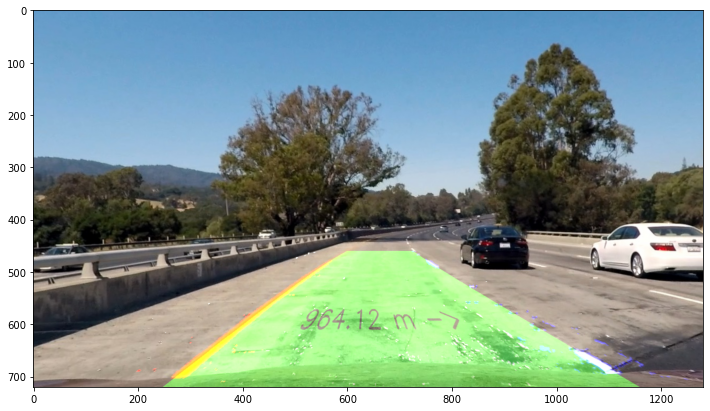

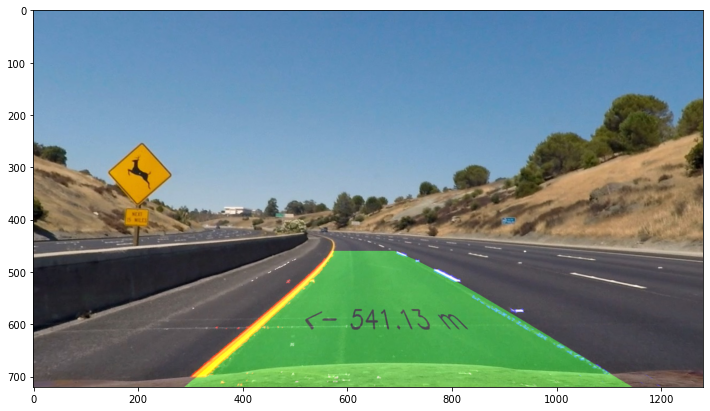

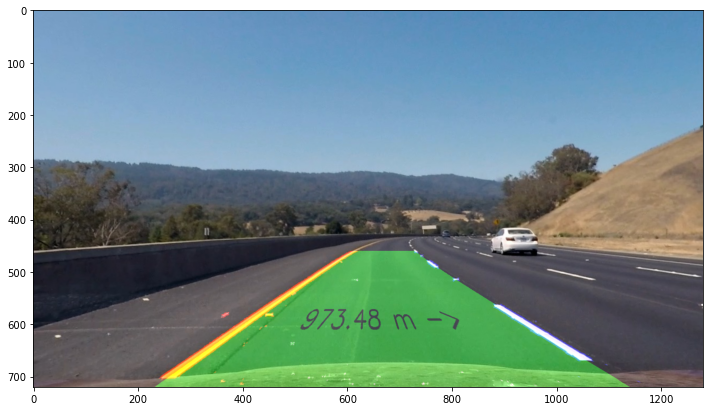

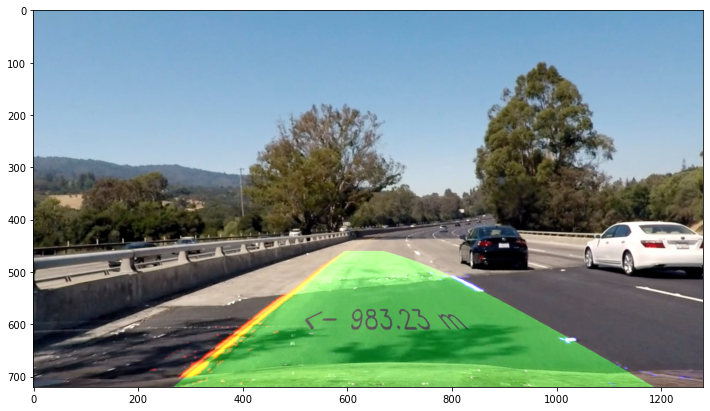

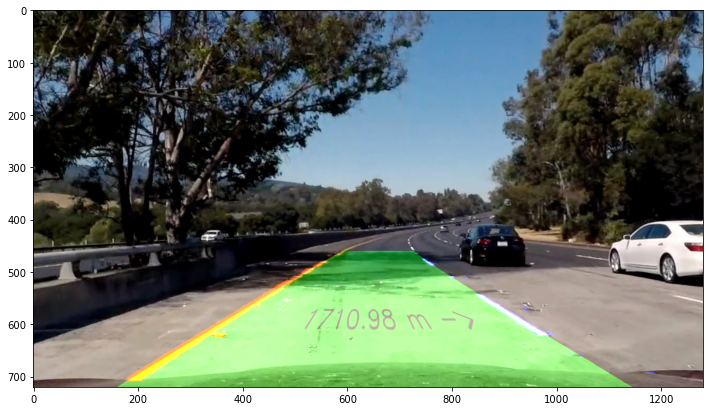

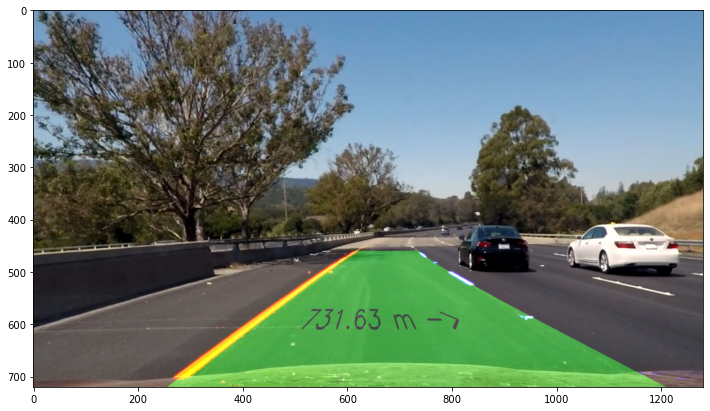

In [ ]:
for i, image in enumerate(warped_lanes):
    unwarped = cv2.warpPerspective(image, inv_mtx, (width, height))
    identified_lane = cv2.addWeighted(undistorted_images[i], 1, unwarped, 0.5, 0)
    plt.figure(figsize=(12, 7))
    plt.imshow(identified_lane)

## Applying the pipeline to a video

In [ ]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import *
from IPython.display import HTML

<h1 style="color:red"> How to use Previous? </h1>

In [ ]:
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = [np.array([False])]  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #x values for detected line pixels
        self.allx = None  
        #y values for detected line pixels
        self.ally = None  

In [ ]:
def process_image(image):
    """This function takes an image and returns a copy of the image with the lanes drawn on it, by following the pipeline described above"""
    
    try:
        # get the shape of the image
        height, width, _ = image.shape
        undistorted = cv2.undistort(image, mtx, dist)  # undistort the image
        color_mask = color_focus(undistorted)  # find the yellow and white pixels
        
        # find the pixels with an acceptable gradient magnitude and direction
        mag_binary = mag_thresh(image)  # gradient magnitude mask
        dir_binary = dir_thresh(image, sobel_kernel=15, thresh=(np.radians(20), np.radians(50)))  # gradient direction mask
        mag_dir_mask = np.uint8(mag_binary & dir_binary) * 255  # combination of gradient magnitude and direction masks
        # combine the color and gradient magnitude and direction mask
        full_mask = color_mask | mag_dir_mask

        # find the top view of the road
        warped_full_mask = cv2.warpPerspective(full_mask, persp_mtx, (width, height), flags=cv2.INTER_LINEAR)
        # fit polynomials on the lane lines
        left_fitx, right_fitx, ploty, out_img = fit_polynomial(warped_full_mask)

        unwarped = cv2.warpPerspective(out_img, inv_mtx, (width, height))
        identified_lane = cv2.addWeighted(undistorted, 1, unwarped, 0.5, 0)

        return identified_lane
    
    # if there's any error, return a black image
    except e:
        print(e)
        return np.zeros_like(image)

In [ ]:
def addFrameN(clip):
    """
    A function to help with debbugging.
    It takes a video as input and returns a copy of the video with frame numbers written on it.
    """
    # getting each frame as an array in a numpy array
    frames = np.array(list(clip.iter_frames()))
    height, width = frames[0].shape
    new_clip = np.zeros_like(frames)  # a placeholder for the returned video
    
    for i, frame in enumerate(frames):
        cv2.putText(frame, str(i), (round(0.1*width), round(0.1*height)), cv2.FONT_HERSHEY_SIMPLEX, 2, (255, 0, 0), 3)
        new_clip[i] = frame
    return ImageSequenceClip(list(new_clip), fps=clip.fps)

## Compiling the videos

In [ ]:
project_video_result = 'output_videos/project_video_result.mp4'
clip1 = VideoFileClip("project_video.mp4")
result = clip1.fl_image(process_image)  # NOTE: this function expects color images!!
# white_clip = addFrameN(white_clip)
%time result.write_videofile(project_video_result, audio=False)

t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]Moviepy - Building video project_video_result.mp4.
Moviepy - Writing video project_video_result.mp4

Moviepy - Done !
Moviepy - video ready project_video_result.mp4
Wall time: 5min 11s


In [ ]:
HTML("""
<video  controls>
  <source src="{0}">
</video>
""".format(project_video_result))

In [ ]:
challenge_video_result = 'output_videos/challenge_video.mp4'
